In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt

In [2]:
#pd.set_option('display.max_rows', None)
pd.reset_option('^display.', silent=True)

In [3]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [4]:
%matplotlib inline
import seaborn as sns
sns.set()
from PIL import Image


In [5]:
from glob import glob
from skimage.io import imread
from os import listdir
import os

In [6]:
files = listdir("D:/Breast Cancer/Dataset")
print(len(files))

280


In [7]:
files = listdir("D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5/")
len(files)

279

In [8]:
base_path = "D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5/"
folder = listdir(base_path)
len(folder)

279

In [9]:
total_images = 0
for n in range(len(folder)):
    patient_id = folder[n]
    for c in [0, 1]:
        patient_path = base_path + patient_id 
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        total_images += len(subfiles)
total_images

277524

In [10]:
data = pd.DataFrame(index=np.arange(0, total_images), columns=["patient_id", "path", "target"])

k = 0
for n in range(len(folder)):
    patient_id = folder[n]
    patient_path = base_path + patient_id 
    for c in [0,1]:
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        for m in range(len(subfiles)):
            image_path = subfiles[m]
            data.iloc[k]["path"] = class_path + image_path
            data.iloc[k]["target"] = c
            data.iloc[k]["patient_id"] = patient_id
            k += 1  

data.head()

,patient_id,path,target
0,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
1,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
2,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
3,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
4,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0


In [12]:
data.shape

(277524, 3)

In [13]:
data

,patient_id,path,target
0,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
1,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
2,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
3,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
4,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0
...,...,...,...
277519,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
277520,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
277521,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
277522,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1


In [14]:
data.target.value_counts()


0    198738
1     78786
Name: target, dtype: int64

In [15]:
data.loc[data['target'] == 1]

,patient_id,path,target
479,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
480,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
481,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
482,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
483,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
...,...,...,...
277519,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
277520,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
277521,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1
277522,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1


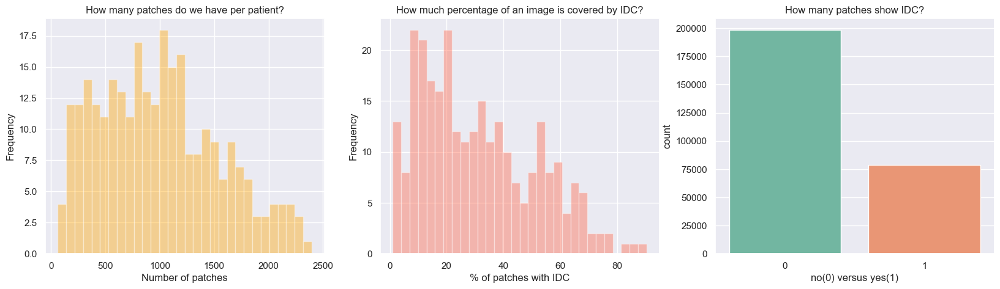

In [13]:
cancer_perc = data.groupby("patient_id").target.value_counts()/ data.groupby("patient_id").target.size()
cancer_perc = cancer_perc.unstack()

fig, ax = plt.subplots(1,3,figsize=(20,5))
sns.distplot(data.groupby("patient_id").size(), ax=ax[0], color="Orange", kde=False, bins=30)
ax[0].set_xlabel("Number of patches")
ax[0].set_ylabel("Frequency");
ax[0].set_title("How many patches do we have per patient?");
sns.distplot(cancer_perc.loc[:, 1]*100, ax=ax[1], color="Tomato", kde=False, bins=30)
ax[1].set_title("How much percentage of an image is covered by IDC?")
ax[1].set_ylabel("Frequency")
ax[1].set_xlabel("% of patches with IDC");
#sns.countplot(data.target, palette="Set2", ax=ax[2]);
#sns.countplot(data.loc[data['target'] == 1], palette="Set2", ax=ax[2]);
sns.countplot(data=data,x='target', palette="Set2", ax=ax[2]);
ax[2].set_xlabel("no(0) versus yes(1)")
ax[2].set_title("How many patches show IDC?");

In [16]:
data.target = data.target.astype(np.int)
pos_selection = np.random.choice(data[data.target==1].index.values, size=50, replace=False)
neg_selection = np.random.choice(data[data.target==0].index.values, size=50, replace=False)

Cancer patches

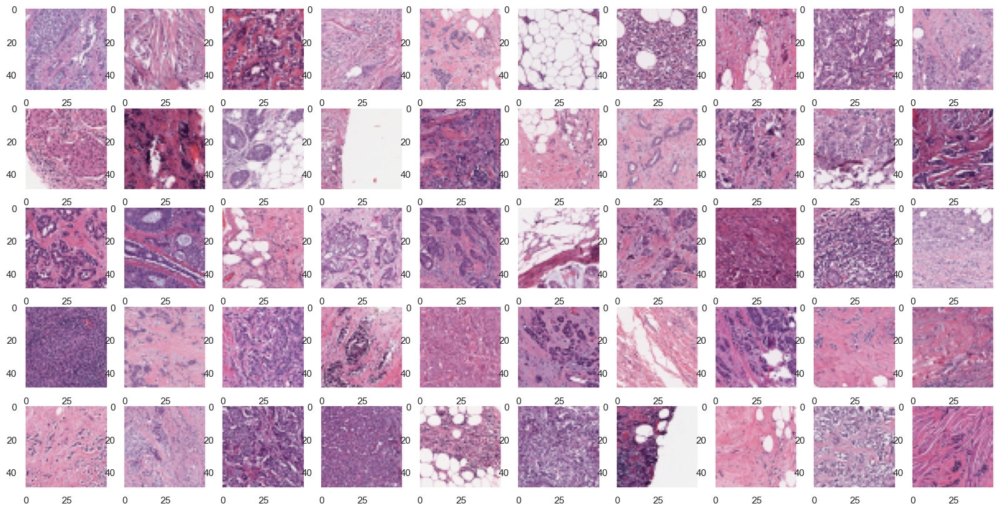

In [16]:
fig, ax = plt.subplots(5,10,figsize=(20,10))

for n in range(5):
    for m in range(10):
        idx = pos_selection[m + 10*n]
        image = imread(data.loc[idx, "path"])
        ax[n,m].imshow(image)
        ax[n,m].grid(False)

Healthy Patches

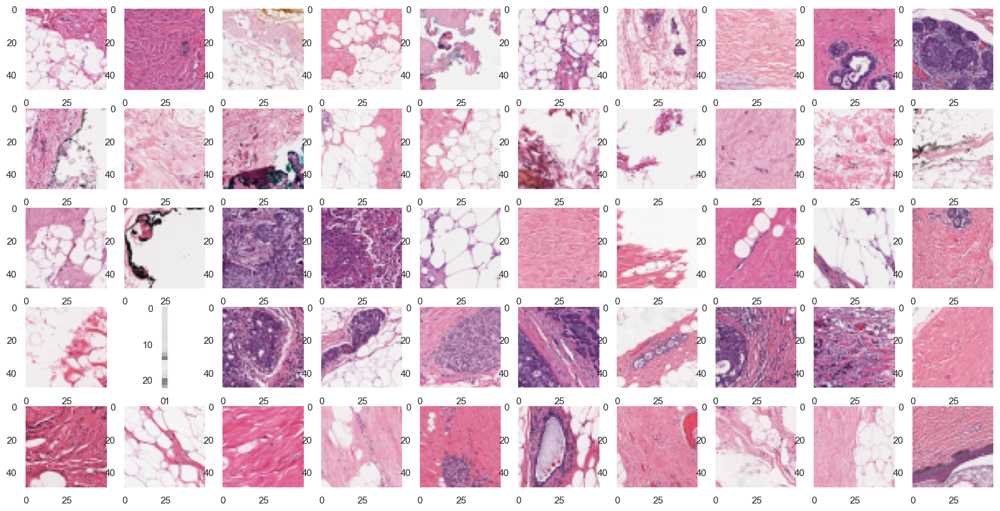

In [33]:
fig, ax = plt.subplots(5,10,figsize=(20,10))

for n in range(5):
    for m in range(10):
        idx = neg_selection[m + 10*n]
        image = imread(data.loc[idx, "path"])
        ax[n,m].imshow(image)
        ax[n,m].grid(False)

Extract Cordinate of patches to reconsrtuct tissue

In [11]:
def extract_coords(df):
    coord = df.path.str.rsplit("_", n=4, expand=True)
    coord = coord.drop([0, 1, 4], axis=1)
    coord = coord.rename({2: "x", 3: "y"}, axis=1)
    coord.loc[:, "x"] = coord.loc[:,"x"].str.replace("x", "", case=False).astype(np.int)
    coord.loc[:, "y"] = coord.loc[:,"y"].str.replace("y", "", case=False).astype(np.int)
    df.loc[:, "x"] = coord.x.values
    df.loc[:, "y"] = coord.y.values
    return df

def get_cancer_dataframe(patient_id, cancer_id):
    path = base_path + patient_id + "/" + cancer_id
    files = listdir(path)
    dataframe = pd.DataFrame(files, columns=["filename"])
    path_names = path + "/" + dataframe.filename.values
    dataframe = dataframe.filename.str.rsplit("_", n=4, expand=True)
    dataframe.loc[:, "target"] = np.int(cancer_id)
    dataframe.loc[:, "path"] = path_names
    dataframe = dataframe.drop([0, 1, 4], axis=1)
    dataframe = dataframe.rename({2: "x", 3: "y"}, axis=1)
    dataframe.loc[:, "x"] = dataframe.loc[:,"x"].str.replace("x", "", case=False).astype(np.int)
    dataframe.loc[:, "y"] = dataframe.loc[:,"y"].str.replace("y", "", case=False).astype(np.int)
    return dataframe

def get_patient_dataframe(patient_id):
    df_0 = get_cancer_dataframe(patient_id, "0")
    df_1 = get_cancer_dataframe(patient_id, "1")
    patient_df = df_0.append(df_1)
    return patient_df

In [12]:
complete_data=extract_coords(data)
complete_data

,patient_id,path,target,x,y
0,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1001
1,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1051
2,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1101
3,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1151
4,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1201
...,...,...,...,...,...
277519,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1,2051,901
277520,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1,2051,951
277521,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1,2101,1001
277522,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1,2101,901


In [13]:
example = get_patient_dataframe(data.patient_id.values[0])
example

,x,y,target,path
0,1001,1001,0,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...
1,1001,1051,0,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...
2,1001,1101,0,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...
3,1001,1151,0,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...
4,1001,1201,0,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...
...,...,...,...,...
65,851,601,1,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...
66,851,651,1,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...
67,851,701,1,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...
68,851,751,1,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...


Binary target visualisation per tissue slice

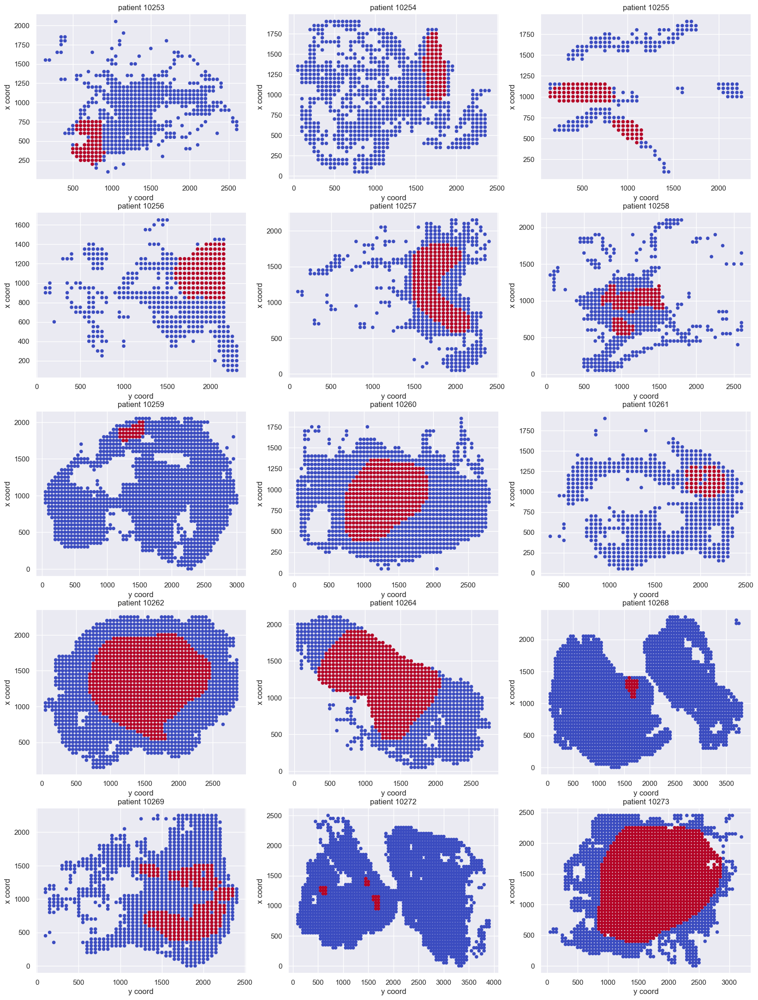

In [54]:
fig, ax = plt.subplots(5,3,figsize=(20, 27))

patient_ids = data.patient_id.unique()

for n in range(5):
    for m in range(3):
        patient_id = patient_ids[m + 3*n]
        example_df = get_patient_dataframe(patient_id)
        
        ax[n,m].scatter(example_df.x.values, example_df.y.values, c=example_df.target.values, cmap="coolwarm", s=20);
        ax[n,m].set_title("patient " + patient_id)
        ax[n,m].set_xlabel("y coord")
        ax[n,m].set_ylabel("x coord")

Visualising the breast tissue images

In [14]:
def visualise_breast_tissue(patient_id, pred_df=None):
    example_df = get_patient_dataframe(patient_id)
    max_point = [example_df.y.max()-1, example_df.x.max()-1]
    grid = 255*np.ones(shape = (max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    mask = 255*np.ones(shape = (max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    if pred_df is not None:
        patient_df = pred_df[pred_df.patient_id == patient_id].copy()
    mask_proba = np.zeros(shape = (max_point[0] + 50, max_point[1] + 50, 1)).astype(np.float)
    
    broken_patches = []
    for n in range(len(example_df)):
        try:
            image = imread(example_df.path.values[n])
            
            target = example_df.target.values[n]
            
            x_coord = np.int(example_df.x.values[n])
            y_coord = np.int(example_df.y.values[n])
            x_start = x_coord - 1
            y_start = y_coord - 1
            x_end = x_start + 50
            y_end = y_start + 50

            grid[y_start:y_end, x_start:x_end] = image
            if target == 1:
                mask[y_start:y_end, x_start:x_end, 0] = 250
                mask[y_start:y_end, x_start:x_end, 1] = 0
                mask[y_start:y_end, x_start:x_end, 2] = 0
            if pred_df is not None:
                
                #proba = patient_df[
                #   (patient_df.x==x_coord) & (patient_df.y==y_coord)].proba
                #mask_proba[y_start:y_end, x_start:x_end, 0] = np.float(proba)

                probability = patient_df[
                    (patient_df.x==x_coord) & (patient_df.y==y_coord)].probability
                mask_proba[y_start:y_end, x_start:x_end, 0] = np.float(probability)
                
        except ValueError:
            broken_patches.append(example_df.path.values[n])
    
    
    return grid, mask, broken_patches, mask_proba

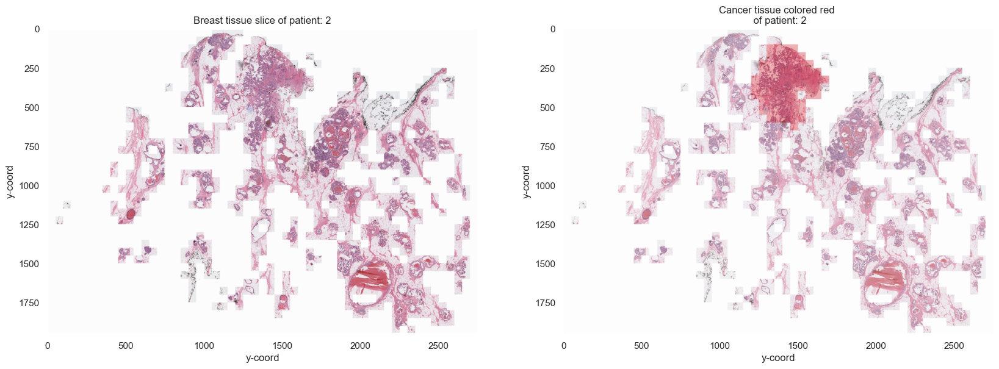

In [83]:
def exam(ex):
    example = '12872'
    grid, mask, broken_patches,_ = visualise_breast_tissue(example)

    fig, ax = plt.subplots(1,2,figsize=(20,10))
    ax[0].imshow(grid, alpha=0.9)
    ax[1].imshow(mask, alpha=0.8)
    ax[1].imshow(grid, alpha=0.7)
    ax[0].grid(False)
    ax[1].grid(False)
    for m in range(2):
        ax[m].set_xlabel("y-coord")
        ax[m].set_ylabel("y-coord")
    ax[0].set_title("Breast tissue slice of patient: " + patient_id)
    ax[1].set_title("Cancer tissue colored red \n of patient: " + patient_id);
    return
exam('12872')

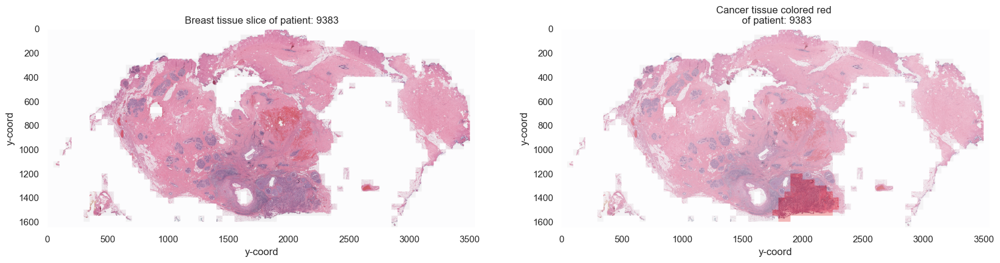

In [59]:
''''example = "9266"
grid, mask, broken_patches,_ = visualise_breast_tissue(example)
fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(grid, alpha=0.9)
ax[1].imshow(mask, alpha=0.8)
ax[1].imshow(grid, alpha=0.7)
ax[0].grid(False)
ax[1].grid(False)
for m in range(2):
    ax[m].set_xlabel("y-coord")
    ax[m].set_ylabel("y-coord")
ax[0].set_title("Breast tissue slice of patient: " + patient_id)
ax[1].set_title("Cancer tissue colored red \n of patient: " + patient_id);

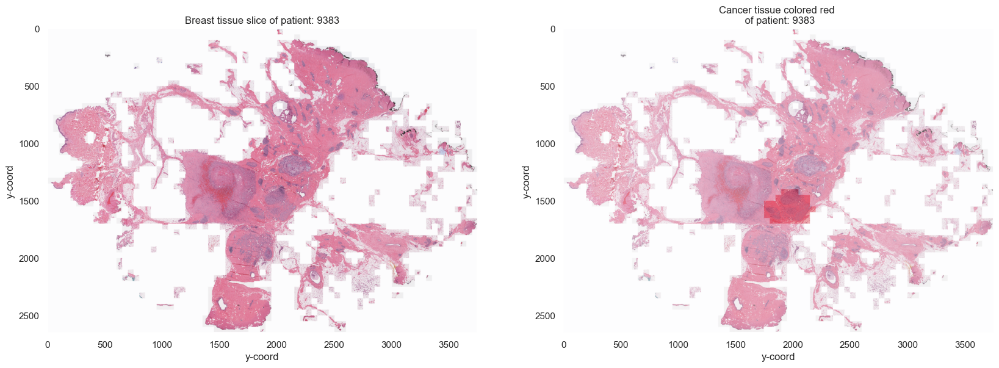

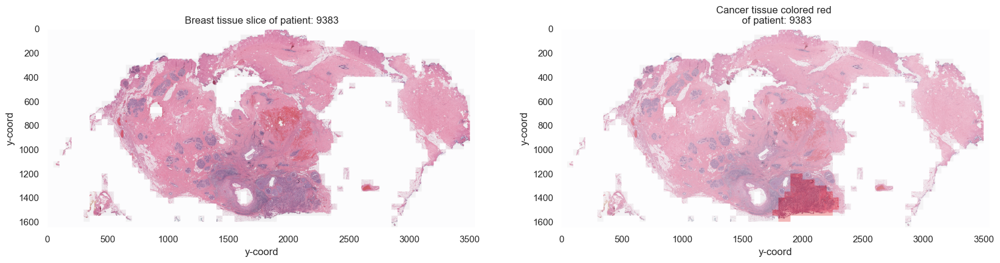

In [62]:
for i in range(260,262):
    exam(a[i])

In [63]:
a=data.patient_id.unique()
a

array(['10253', '10254', '10255', '10256', '10257', '10258', '10259',
       '10260', '10261', '10262', '10264', '10268', '10269', '10272',
       '10273', '10274', '10275', '10276', '10277', '10278', '10279',
       '10282', '10285', '10286', '10288', '10290', '10291', '10292',
       '10293', '10295', '10299', '10300', '10301', '10302', '10303',
       '10304', '10305', '10306', '10307', '10308', '12241', '12242',
       '12626', '12748', '12749', '12750', '12751', '12752', '12810',
       '12811', '12817', '12818', '12819', '12820', '12821', '12822',
       '12823', '12824', '12826', '12867', '12868', '12869', '12870',
       '12871', '12872', '12873', '12875', '12876', '12877', '12878',
       '12879', '12880', '12881', '12882', '12883', '12884', '12886',
       '12890', '12891', '12892', '12893', '12894', '12895', '12896',
       '12897', '12898', '12900', '12901', '12905', '12906', '12907',
       '12908', '12909', '12910', '12911', '12929', '12930', '12931',
       '12932', '129

In [15]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import minmax_scale
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, roc_curve, roc_auc_score

In [16]:
patients = data.patient_id.unique()

train_ids, sub_test_ids = train_test_split(patients,
                                           test_size=0.3,
                                           random_state=0)
test_ids, dev_ids = train_test_split(sub_test_ids, test_size=0.5, random_state=0)

In [17]:
print(len(train_ids)/patients.shape[0]*100, len(dev_ids)/patients.shape[0]*100, len(test_ids)/patients.shape[0]*100)

69.89247311827957 15.053763440860216 15.053763440860216


In [18]:
print(len(train_ids), len(dev_ids), len(test_ids))

195 42 42


In [19]:
train_df = data.loc[data.patient_id.isin(train_ids),:].copy()
test_df = data.loc[data.patient_id.isin(test_ids),:].copy()
dev_df = data.loc[data.patient_id.isin(dev_ids),:].copy()

train_df = extract_coords(train_df)
test_df = extract_coords(test_df)
dev_df = extract_coords(dev_df)

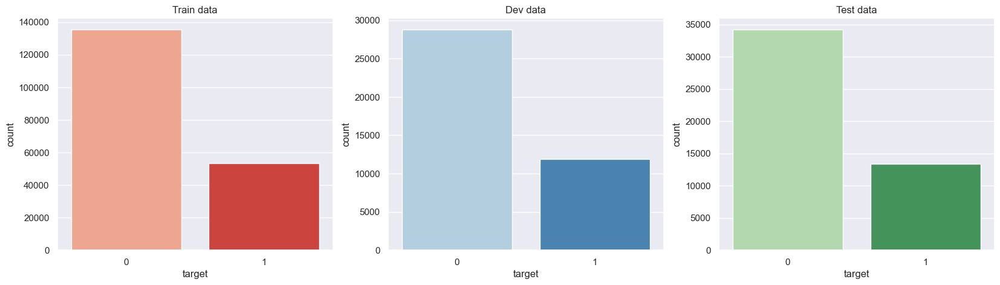

In [27]:
fig, ax = plt.subplots(1,3,figsize=(20,5))
sns.countplot(data=train_df,x='target', palette="Reds", ax=ax[0]);
ax[0].set_title("Train data");
sns.countplot(data=dev_df,x='target', palette="Blues", ax=ax[1]);
ax[1].set_title("Dev data")
sns.countplot(data=test_df,x='target', palette="Greens", ax=ax[2]);
ax[2].set_title("Test data");

In [28]:
train_df

,patient_id,path,target,x,y
0,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1001
1,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1051
2,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1101
3,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1151
4,10253,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,0,1001,1201
...,...,...,...,...,...
277519,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1,2051,901
277520,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1,2051,951
277521,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1,2101,1001
277522,9383,D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...,1,2101,901


In [29]:
train_df.groupby('target').count()

,patient_id,path,x,y
target,,,,
0,135641,135641,135641,135641
1,53515,53515,53515,53515


In [30]:
dev_df.groupby('target').count()

,patient_id,path,x,y
target,,,,
0,28844,28844,28844,28844
1,11903,11903,11903,11903


In [31]:
test_df.groupby('target').count()

,patient_id,path,x,y
target,,,,
0,34253,34253,34253,34253
1,13368,13368,13368,13368


In [20]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print('yes')

yes


In [32]:
#Prevent gpu from over running
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=5120)])
    except RunTimeError as e:
        print(e)

In [20]:
def get_img_array(img_path, size):
    images = []
    for img in img_path:
        img = keras.preprocessing.image.load_img(img, target_size = size)
        img = keras.preprocessing.image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        images.append(img)
    images = np.vstack(images)
    return images

In [21]:
def get_train_test_data(df, save = False):

    print('Train patient IDs: ', train_df.patient_id.unique())
    
    print('Test patient IDs: ', test_ids)



    size = (50, 50)
    
    train_x = get_img_array(train_df['path'], size)
    test_x = get_img_array(test_df['path'], size)
    train_y = train_df['target']
    test_y = test_df['target']
    #print (train_x.shape)
    if save:
        np.save('./X_train.npy',train_x)
        np.save('./X_test.npy',test_x)
        np.save('./y_train.npy',train_y)
        np.save('./y_test.npy',test_y)
    
    return (train_ids, test_ids), (train_x, train_y), (test_x, test_y)

gfg = tf.data.Dataset.from_tensor_slices((X_train, y_train))
#val_dataset = tf.data.Dataset.from_tensor_slices((x_val, y_val))  
gfg
#Output: <TensorSliceDataset shapes: ((50, 50, 3), ()), types: (tf.float32, tf.int32)>

print(type(X_test))
print(type(gfg))
#output: <class 'numpy.ndarray'>
<class 'tensorflow.python.data.ops.dataset_ops.TensorSliceDataset'>

In [22]:
(train_ids, test_ids), (X_train, y_train), (X_test, y_test) = get_train_test_data(data)
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

Train patient IDs:  ['10253' '10254' '10255' '10256' '10257' '10259' '10262' '10264' '10268'
 '10272' '10273' '10275' '10276' '10278' '10282' '10286' '10288' '10290'
 '10291' '10293' '10295' '10299' '10300' '10301' '10302' '10303' '10304'
 '10305' '10307' '10308' '12241' '12242' '12626' '12748' '12752' '12810'
 '12811' '12817' '12818' '12819' '12820' '12823' '12824' '12826' '12868'
 '12869' '12870' '12873' '12875' '12876' '12877' '12878' '12879' '12881'
 '12884' '12890' '12891' '12892' '12893' '12895' '12896' '12897' '12898'
 '12900' '12901' '12905' '12908' '12910' '12911' '12929' '12930' '12932'
 '12933' '12934' '12947' '12949' '12951' '12955' '13018' '13019' '13022'
 '13023' '13024' '13025' '13106' '13400' '13402' '13403' '13404' '13459'
 '13461' '13462' '13591' '13613' '13617' '13666' '13687' '13688' '13689'
 '13691' '13693' '13694' '14078' '14079' '14081' '14082' '14155' '14156'
 '14157' '14188' '14190' '14191' '14212' '14304' '14306' '14321' '15471'
 '15472' '15473' '15510' '15512

In [27]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_dataset

MemoryError: Unable to allocate 5.28 GiB for an array with shape (189156, 50, 50, 3) and data type float32

In [41]:
test_df.patient_id.unique()

array(['10260', '10261', '10306', '12749', '12750', '12867', '12871',
       '12872', '12880', '12882', '12886', '12894', '12906', '12909',
       '12931', '12935', '13021', '13458', '13460', '13616', '13916',
       '14153', '14154', '14192', '14210', '14211', '14213', '14305',
       '15516', '16550', '16568', '8950', '8975', '8984', '9023', '9029',
       '9073', '9123', '9227', '9259', '9291', '9325'], dtype=object)

In [42]:
def get_val_data(df, save = False):

    print('Dev patient IDs: ', dev_df.patient_id.unique())
    
    size = (50, 50)
    
    val_x = get_img_array(dev_df['path'], size)
    
    val_y = dev_df['target']
    
    #print (train_x.shape)
    if save:
        np.save('./X_val.npy',val_x)
        np.save('./y_val.npy',val_y)
    
    return (dev_ids), (val_x, val_y)

In [43]:
(dev_ids), (X_val, y_val) = get_val_data(data)
print('X_val shape: ', X_val.shape)
print('y_val shape: ', y_val.shape)

Dev patient IDs:  ['10258' '10269' '10274' '10277' '10279' '10285' '10292' '12751' '12821'
 '12822' '12883' '12907' '12948' '12954' '13020' '13401' '13692' '14189'
 '14209' '15513' '15840' '15903' '16165' '16553' '16896' '8863' '8864'
 '8917' '8918' '8951' '8957' '9022' '9075' '9083' '9135' '9173' '9174'
 '9178' '9255' '9267' '9319' '9324']
X_val shape:  (40747, 50, 50, 3)
y_val shape:  (40747,)


In [44]:
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
val_dataset

<TensorSliceDataset shapes: ((50, 50, 3), ()), types: (tf.float32, tf.int32)>

In [45]:
val_dataset2 = (X_val,y_val)
val_dataset2

(array([[[[244., 240., 241.],
          [244., 239., 241.],
          [244., 239., 241.],
          ...,
          [244., 241., 242.],
          [243., 240., 242.],
          [243., 241., 242.]],
 
         [[244., 239., 242.],
          [244., 239., 241.],
          [244., 239., 241.],
          ...,
          [244., 241., 242.],
          [243., 240., 242.],
          [243., 241., 242.]],
 
         [[244., 239., 242.],
          [243., 239., 241.],
          [243., 239., 241.],
          ...,
          [244., 241., 242.],
          [243., 241., 242.],
          [243., 241., 242.]],
 
         ...,
 
         [[212.,  98., 148.],
          [217., 102., 150.],
          [219., 116., 161.],
          ...,
          [243., 240., 241.],
          [243., 239., 241.],
          [243., 239., 241.]],
 
         [[209., 114., 160.],
          [212., 107., 156.],
          [220., 113., 161.],
          ...,
          [243., 240., 241.],
          [243., 239., 241.],
          [243., 239., 241.

In [51]:
class Mymodel1(keras.Model):
    def __init__(self):
        super().__init__()
        self.base = keras.applications.EfficientNetB2(include_top = False, weights = 'imagenet', input_shape = (50, 50, 3))
        self.base.trainable = False
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(256, activation = 'relu')
        self.dense2 = layers.Dense(128, activation = 'relu')
        self.dense3 = layers.Dense(64, activation = 'relu')
        self.dense4 = layers.Dense(1, activation = 'sigmoid')

    def call(self, inputs):
        x = self.base(inputs)
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dense2(x)
        x = self.dense3(x)
        return self.dense4(x)   
    
model = Mymodel1()

model.compile(optimizer = keras.optimizers.Adam(learning_rate = 0.001),
             loss = 'binary_crossentropy',
             metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 50, validation_data = val_dataset2)
keras.models.save_model(model, 'Mymodel')
model.summary()

Epoch 1/50
5912/5912 [==============================] - 188s 30ms/step - loss: 0.4156 - accuracy: 0.8156 - val_loss: 0.3689 - val_accuracy: 0.8384
Epoch 2/50
5912/5912 [==============================] - 173s 29ms/step - loss: 0.3777 - accuracy: 0.8352 - val_loss: 0.3656 - val_accuracy: 0.8403
Epoch 3/50
5912/5912 [==============================] - 183s 31ms/step - loss: 0.3696 - accuracy: 0.8379 - val_loss: 0.3630 - val_accuracy: 0.8419
Epoch 4/50
5912/5912 [==============================] - 187s 32ms/step - loss: 0.3599 - accuracy: 0.8440 - val_loss: 0.3691 - val_accuracy: 0.8370
Epoch 5/50
5912/5912 [==============================] - 184s 31ms/step - loss: 0.3602 - accuracy: 0.8425 - val_loss: 0.3627 - val_accuracy: 0.8417
Epoch 6/50
5912/5912 [==============================] - 183s 31ms/step - loss: 0.3573 - accuracy: 0.8442 - val_loss: 0.3587 - val_accuracy: 0.8431
Epoch 7/50
5912/5912 [==============================] - 189s 32ms/step - loss: 0.3516 - accuracy: 0.8461 - val_loss: 0

In [48]:
model = tf.keras.models.load_model('Mymodel')

model.summary()

Model: "mymodel1_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnetb2 (Functional)  (None, 2, 2, 1408)        7768569   
_________________________________________________________________
flatten_3 (Flatten)          multiple                  0         
_________________________________________________________________
dense_12 (Dense)             multiple                  1442048   
_________________________________________________________________
dense_13 (Dense)             multiple                  32896     
_________________________________________________________________
dense_14 (Dense)             multiple                  8256      
_________________________________________________________________
dense_15 (Dense)             multiple                  65        
Total params: 9,251,834
Trainable params: 1,483,265
Non-trainable params: 7,768,569
______________________________________

In [49]:
def check_loss_acc(history):
    fig, axes = plt.subplots(1, 2, figsize = (20, 10))
    eva = ['loss', 'accuracy']
    for i in range(2):
        sns.lineplot(data = history[eva[i]], ax = axes[i])
        axes[i].set_xlabel('Epoch', fontsize = 15)
        axes[i].set_ylabel(eva[i], fontsize = 15)
    plt.suptitle('Model training evaluation', fontsize = 25)

check_loss_acc(history.history)

NameError: name 'history' is not defined

In [51]:
print(history.params)

NameError: name 'history' is not defined

In [50]:
model.evaluate(X_test, y_test)

1489/1489 [==============================] - 35s 19ms/step - loss: 0.3538 - accuracy: 0.8579


[0.3291810154914856, 0.8690073490142822]

In [63]:
y_test

4767      0
4768      0
4769      0
4770      0
4771      0
         ..
270486    1
270487    1
270488    1
270489    1
270490    1
Name: target, Length: 47621, dtype: int32

In [57]:
def prediction(X_test):
    y_pred = model.predict(X_test).flatten()

    pred_sample = complete_data.loc[y_test.index, :]
    pred_sample['probability'] = y_pred
    return pred_sample

y_pred = prediction(X_test)
print(y_pred)

       patient_id                                               path  target  \
4767        10260  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       0   
4768        10260  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       0   
4769        10260  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       0   
4770        10260  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       0   
4771        10260  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       0   
...           ...                                                ...     ...   
270486       9325  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       1   
270487       9325  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       1   
270488       9325  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       1   
270489       9325  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       1   
270490       9325  D:/Breast Cancer/Dataset/IDC_regular_ps50_idx5...       1   

           x     y  probability  
4767 

In [68]:
from numba import cuda 
device = cuda.get_current_device()
device.reset()

2


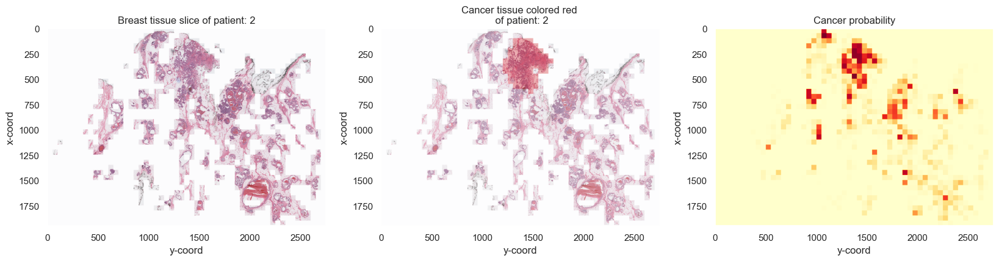

In [80]:
#visualise_breast_tissue(patient_id='9259', pred_df=y_pred)
fig, ax = plt.subplots(1,3,figsize=(20,10))


grid, mask, broken_patches, mask_proba = visualise_breast_tissue(patient_id='12872', pred_df=y_pred)


ax[0].imshow(grid, alpha=0.9)
ax[1].imshow(mask, alpha=0.8)
ax[1].imshow(grid, alpha=0.7)
ax[2].imshow(mask_proba[:,:,0], cmap="YlOrRd")

for m in range(3):
    ax[m].set_xlabel("y-coord")
    ax[m].set_ylabel("x-coord")
    ax[m].grid(False)
print(patient_id)
ax[0].set_title("Breast tissue slice of patient: " + patient_id)
ax[1].set_title("Cancer tissue colored red \n of patient: " + patient_id);
ax[2].set_title("Cancer probability");

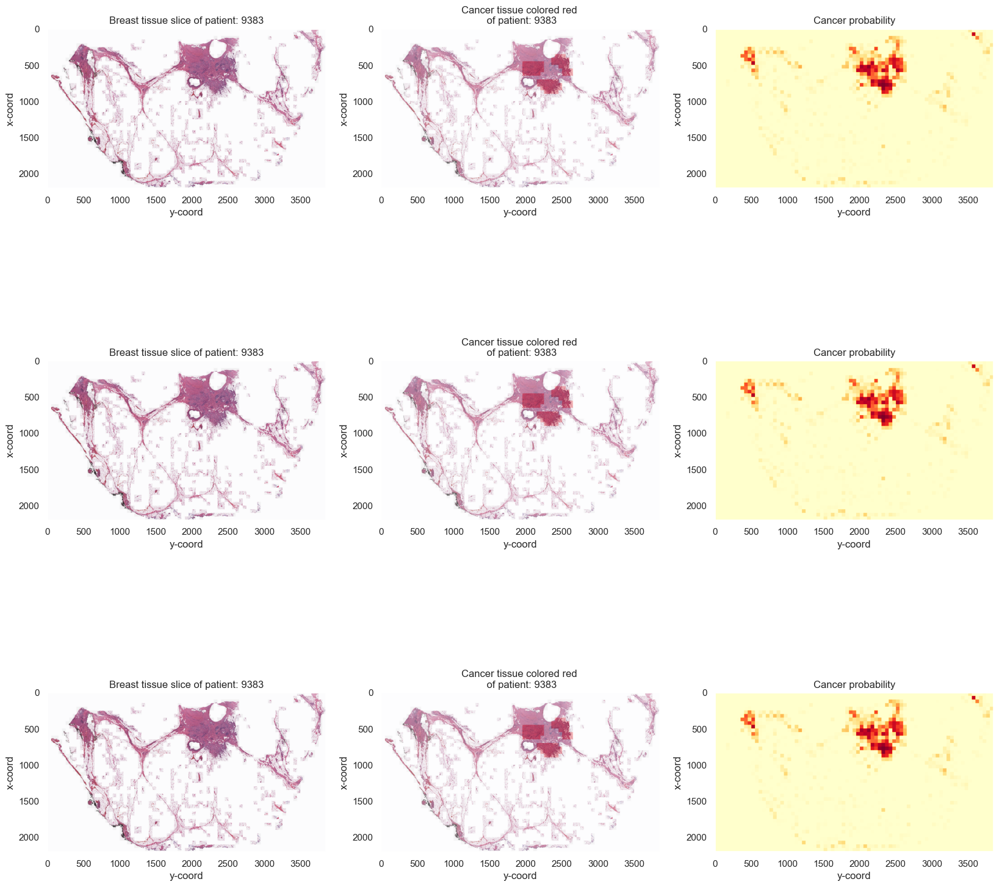

In [59]:
#visualise_breast_tissue(patient_id='9259', pred_df=y_pred)
fig, ax = plt.subplots(3,3,figsize=(20,20))

for n in range(3):
    grid, mask, broken_patches, mask_proba = visualise_breast_tissue(patient_id='9325', pred_df=y_pred)


    ax[n, 0].imshow(grid, alpha=0.9)
    ax[n, 1].imshow(mask, alpha=0.8)
    ax[n, 1].imshow(grid, alpha=0.7)
    ax[n, 2].imshow(mask_proba[:,:,0], cmap="YlOrRd")

    for m in range(3):
        ax[n, m].set_xlabel("y-coord")
        ax[n, m].set_ylabel("x-coord")
        ax[n, m].grid(False)
        
    ax[n, 0].set_title("Breast tissue slice of patient: " + patient_id)
    ax[n, 1].set_title("Cancer tissue colored red \n of patient: " + patient_id);
    ax[n, 2].set_title("Cancer probability");

array(['10260', '10261', '10306', '12749', '12750', '12867', '12871',
       '12872', '12880', '12882', '12886', '12894', '12906', '12909',
       '12931', '12935', '13021', '13458', '13460', '13616', '13916',
       '14153', '14154', '14192', '14210', '14211', '14213', '14305',
       '15516', '16550', '16568', '8950', '8975', '8984', '9023', '9029',
       '9073', '9123', '9227', '9259', '9291', '9325'], dtype=object)